In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [5]:
import scanpy as sc
adata = sc.read_csv('GSM5226574_C51ctr_raw_counts.csv')
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.var['mt'] = adata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
upper_lim = np.quantile(adata.obs.n_genes_by_counts.values, .98)
lower_lim = np.quantile(adata.obs.n_genes_by_counts.values, .02)
adata = adata[(adata.obs.n_genes_by_counts < upper_lim) & (adata.obs.n_genes_by_counts > lower_lim)]
adata = adata[adata.obs.pct_counts_mt < 20]
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata.raw = adata
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
sc.tl.leiden(adata, resolution=0.25)


/Users/josephanthony/miniconda3/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


/Users/josephanthony/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


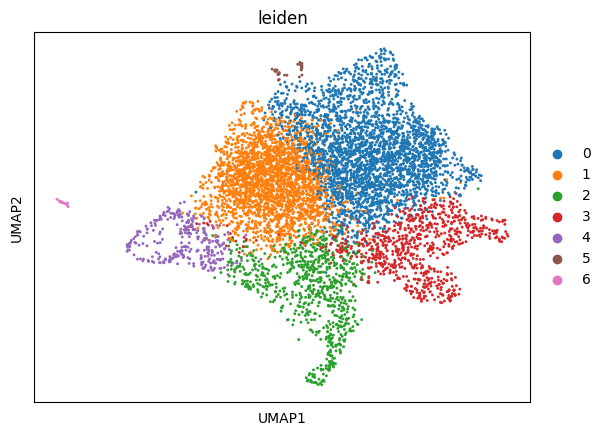

In [6]:
#2D UMAP
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden')

In [7]:
sc.tl.umap(adata, n_components=3)

In [9]:
color = dict(zip(range(0,15), plt.cm.tab20(range(0,15))))

In [10]:
color[1]

array([0.68235294, 0.78039216, 0.90980392, 1.        ])

In [11]:
umap = adata.obsm['X_umap']
umap

array([[ 7.805993  ,  6.7711167 , 13.310503  ],
       [ 6.5778313 ,  7.5604925 , 13.635428  ],
       [ 8.500262  ,  7.1120753 , 12.732064  ],
       ...,
       [-0.40052634, 11.157242  ,  7.398451  ],
       [-0.4397524 , 11.184407  ,  7.371233  ],
       [ 9.751818  ,  7.436889  , 10.497224  ]], dtype=float32)

In [21]:
!mkdir figs

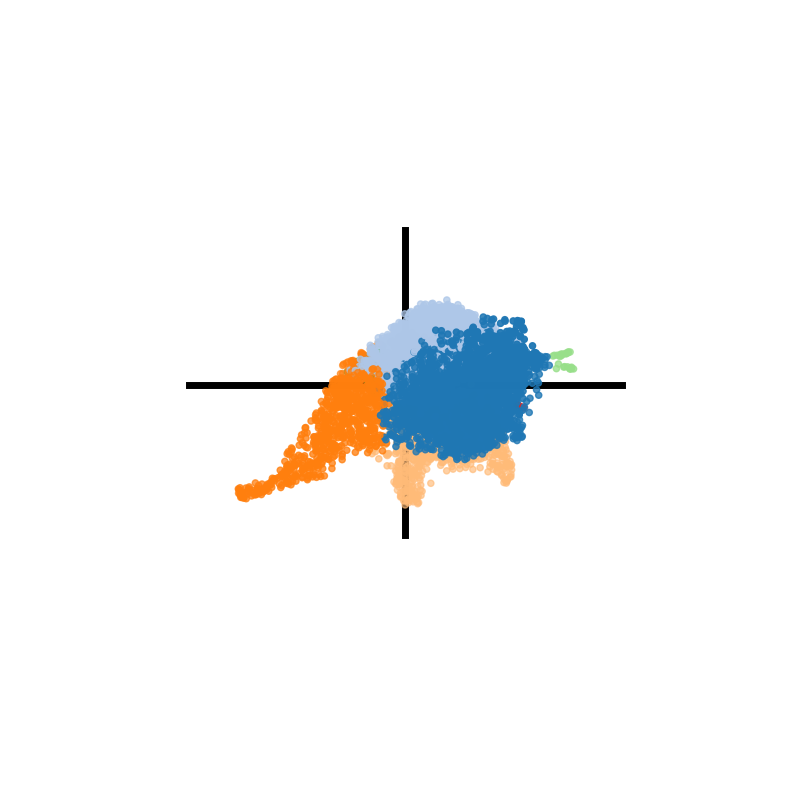

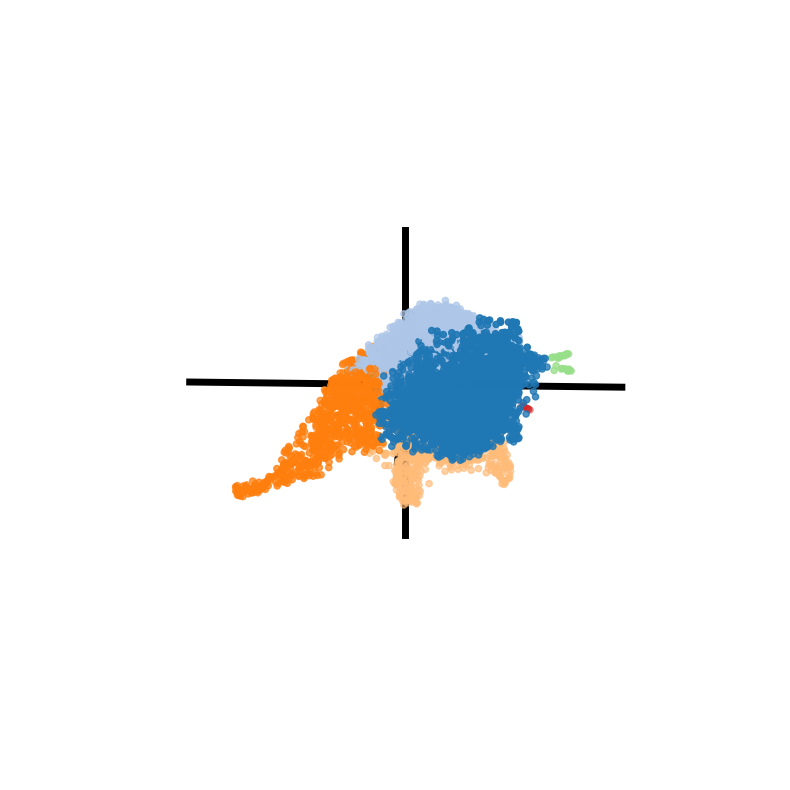

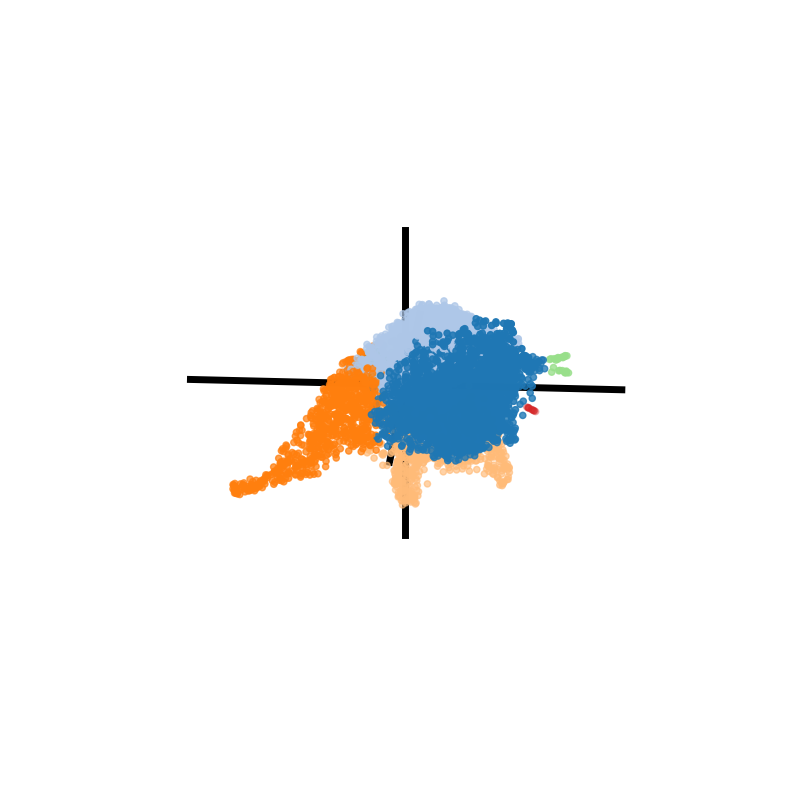

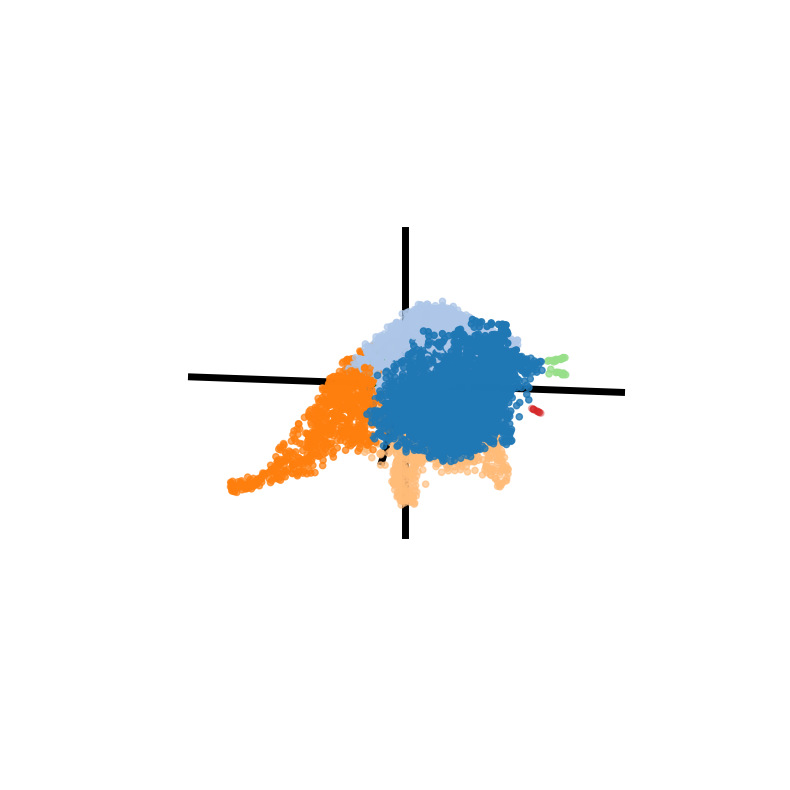

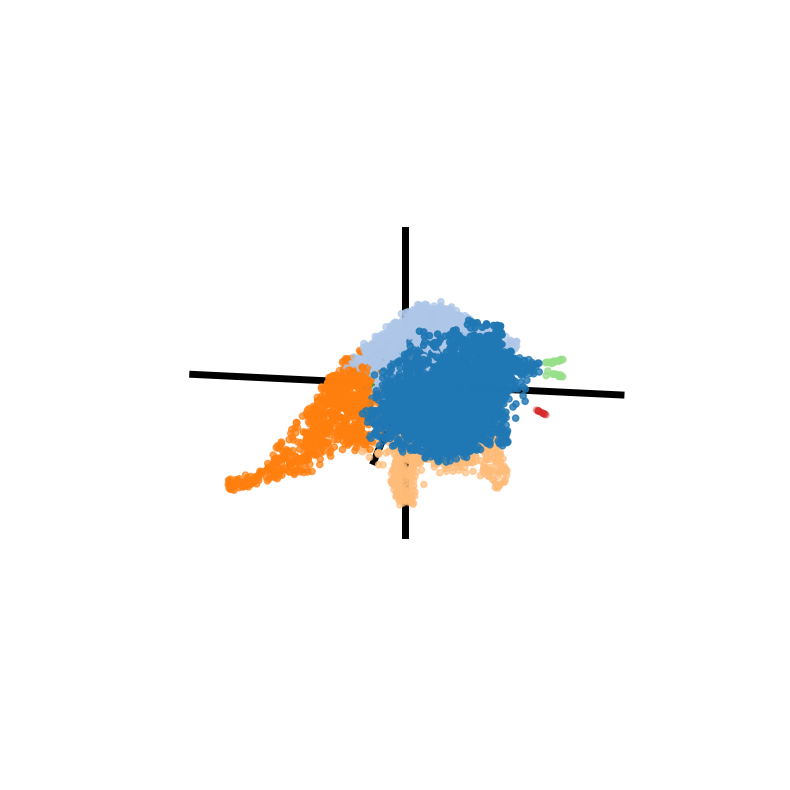

...

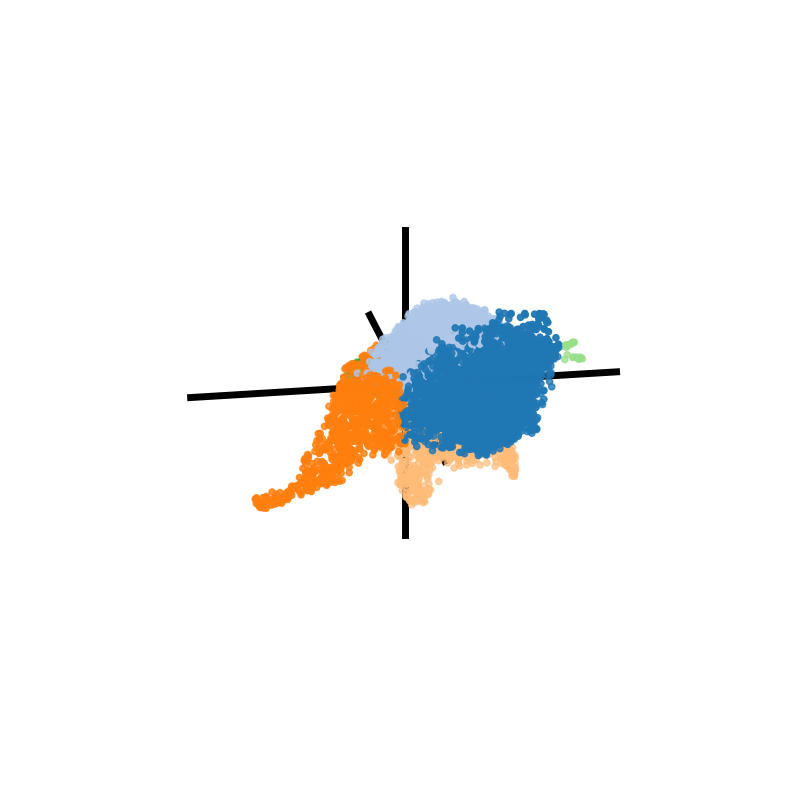

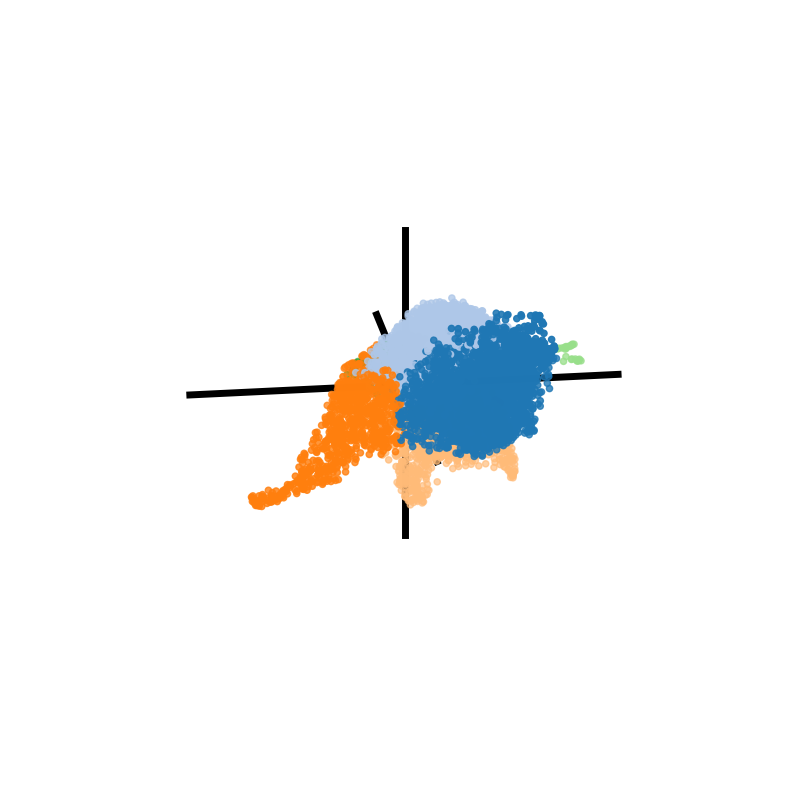

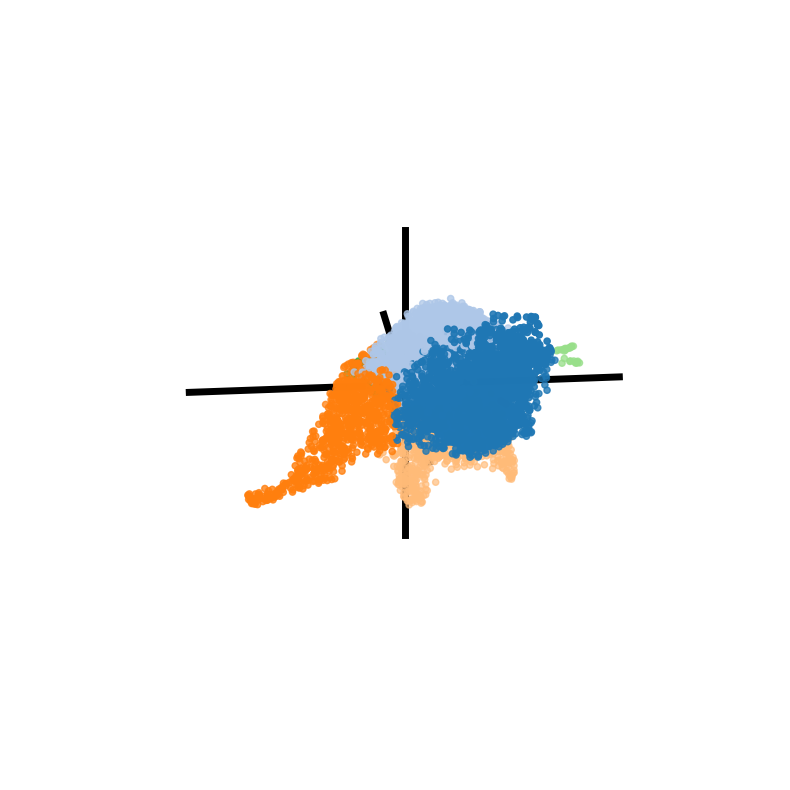

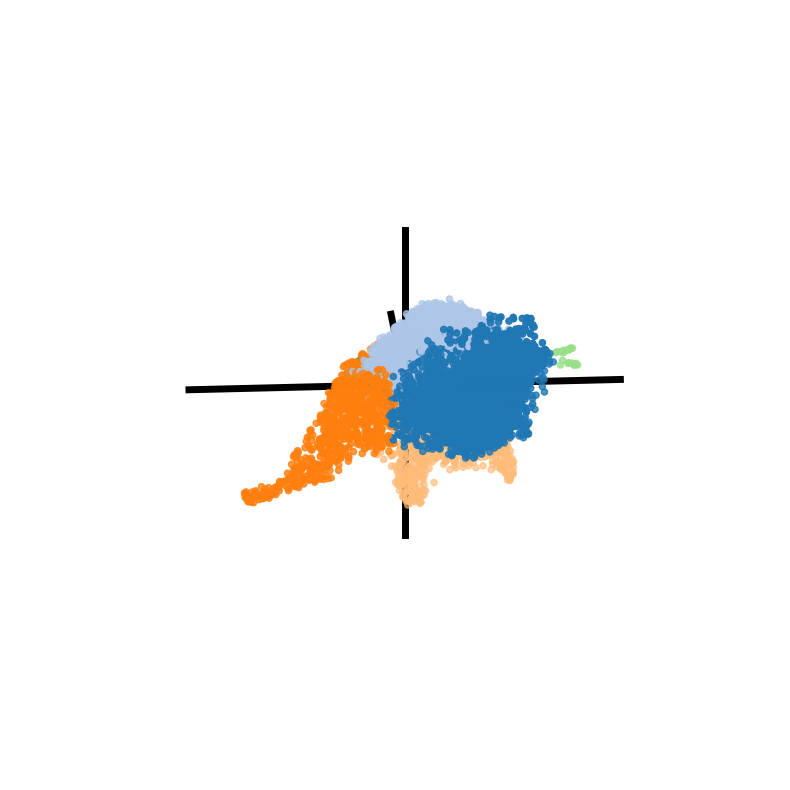

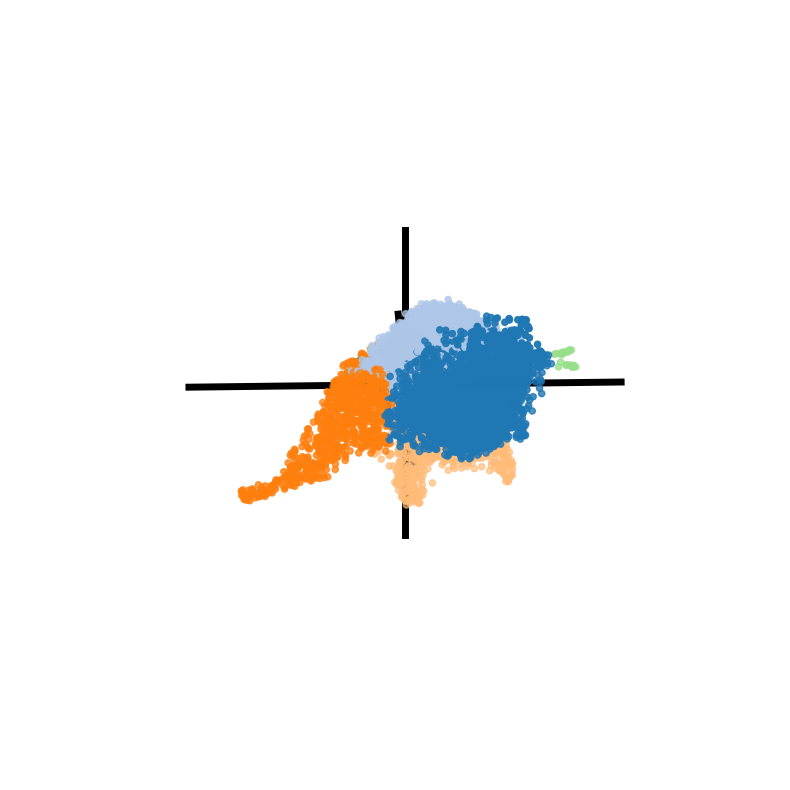

In [22]:
for i in range(0,360, 2):
    fig = plt.figure(figsize = (10,10))
    ax = fig.add_subplot(projection='3d')

    ax.scatter(umap[:,0],umap[:,1],umap[:,2], c = adata.obs.leiden.astype('int').map(color))
    x_center = (umap[:,0].max() + umap[:,0].min())/2
    y_center = (umap[:,1].max() + umap[:,1].min())/2
    z_center = (umap[:,2].max() + umap[:,2].min())/2
    ax.plot([x_center,x_center],[y_center,y_center],[umap[:,2].min() - 2, umap[:,2].max() + 2], c ='k', lw=5)
    ax.plot([x_center,x_center],[umap[:,1].min() - 2, umap[:,1].max() + 2],[z_center,z_center], c ='k', lw=5)
    ax.plot([umap[:,0].min()-2, umap[:,0].max() + 2],[y_center,y_center],[z_center, z_center], c ='k', lw=5)
    ax.view_init(20,i)
    ax.axis('off')
    
    plt.savefig(f'figs/{i:003}.png', dpi=100, facecolor='white')
    plt.show()

In [2]:
!pip install imagemagick

ERROR: Could not find a version that satisfies the requirement imagemagick (from versions: none)
ERROR: No matching distribution found for imagemagick


In [4]:
!convert -delay 5 figs/*.png umap.gif

convert: no decode delegate for this image format `PNG' @ error/constitute.c/ReadImage/741.
convert: no images defined `umap.gif' @ error/convert.c/ConvertImageCommand/3342.
